# Identify specific populations and expand these masks 
We will use gamma delta cells, cells that are hard to identiify sometimes and CD8 T cells as conterpoint 
We will find these regions, expand to see the surroundings and check how this maps in cell segmentation

In [1]:
%load_ext autoreload

import os 
import sys
import time
import logging
import re
from tqdm import tqdm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import json

from natsort import natsorted
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from PIL import Image, ImageDraw
import json
import math
import matplotlib.patches as mpatches


sys.path.append(os.path.dirname(os.getcwd()))
from GRIDGEN.src import get_arrays as ga
from GRIDGEN.src import contours 
from GRIDGEN.src import masks
from GRIDGEN.src.mask_properties import GetMasksProperties

define looger -- important to save info of the runs 

In [2]:
# define the logger :  can be None, and is set to INFO
# Custom logger setup
logger = logging.getLogger('contour_logger')
handler = logging.StreamHandler()
formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')
handler.setFormatter(formatter)
logger.addHandler(handler)
logger.setLevel(logging.INFO)

define files

In [3]:
tma1_path = '../../xenium_data/HLA/GD_TMA1_S3/fov_filtered'
tma2_path = '../../xenium_data/HLA/HLA_TMA2/fov_filtered'
files_tma1 = os.listdir(tma1_path)
files_tma2 = os.listdir(tma2_path)


to_exclude = ['TMA1_Selection15_filtered.csv', # tonsil
              'TMA1_Selection24_filtered.csv', # tonsl 
            'TMA1_Selection18_filtered.csv' , # normal
            'TMA2_Selection11_filtered.csv', # normal
             ]
              
# Adding the full path to each file
files_tma1 = [os.path.join(tma1_path, file) for file in files_tma1 if file not in to_exclude]
files_tma2 = [os.path.join(tma2_path, file) for file in files_tma2 if file not in to_exclude]

files = files_tma1 + files_tma2
print(len(files))

73


# 2. Define GD

This intends to, based on defined genes, find GD cells.

We need to define: 

1. Parameters for GD contours
    * Genes to consider :
  
    * density
    * minimum area
    * kernel size
    
    this will define for an overlapping area with "kernel size" * "kernel_size" a minimum number of "density" genes of interest. The contiguous area of the contour will have at least "minimum area" 
 
2. You may also need to define extra parameters to filter out wrong contours   

In [4]:
# param gd
target_gd = ['TRGC1','TRGC2','TRDC'] 

density_th_gd = 2
min_area_th_gd = 5  # 40
kernel_size_gd = 10 #90 #90

../../xenium_data/HLA/GD_TMA1_S3/fov_filtered/TMA1_Selection25_filtered.csv
n genes: 480
shape: 1935, 1785
n hits 4210232


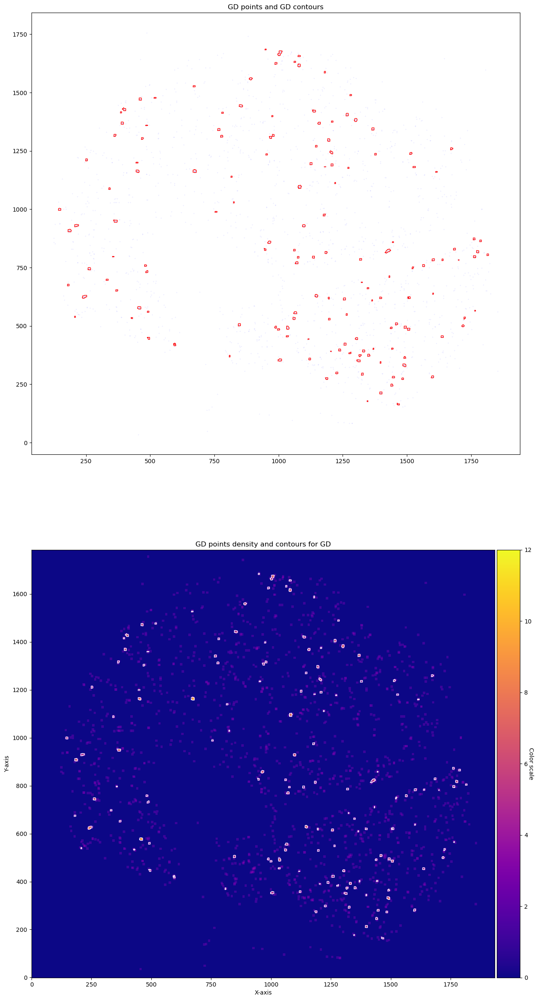

total contours found  150
total contours after filtering by area 150


In [94]:
# we will do for a single file 
file_csv = files[7]
print(file_csv)
df_total = pd.read_csv(file_csv)
df_total = df_total[['x_location', 'y_location', 'feature_name']]
df_total = df_total.rename(columns={'feature_name': 'target'})
df_total = df_total[~df_total['target'].str.contains('System|egative')]
df_total['X'] = df_total['x_location'] - min(df_total['x_location'])
df_total['Y'] = df_total['y_location'] - min(df_total['y_location'])

n_genes = len(df_total['target'].unique())
height = int(max(df_total['X'])) + 1
width = int(max(df_total['Y'])) + 1

print(f'n genes: {n_genes}')
print(f'shape: {height}, {width}')
print(f'n hits {len(df_total)}')

# this makes the sparse df to an array with the spatial information 
target_dict_total = {target: index for index, target in enumerate(df_total['target'].unique())}
array_total = ga.transform_df_to_array(df = df_total, target_dict=target_dict_total, array_shape = (height, width,len(target_dict_total))).astype(np.int8)

# creating subsets 
df_subset_gd, array_subset_gd, target_indices_subset_gd = ga.get_subset_arrays(df_total, array_total,
                                                                                   target_dict_total,
                                                                                   target_list=target_gd,
                                                                                   target_col='target')
### obtain contours 

CGD = contours.GetContour(array_subset_gd, contour_name='GD', logger=logger)
CGD.get_conv_sum(kernel_size=kernel_size_gd, kernel_shape='square')  #
CGD.contours_from_sum(density_threshold=density_th_gd,
                      min_area_threshold=min_area_th_gd, directionality='higher')


fig, axs = plt.subplots(2, 1, figsize=(15, 30))

CGD.plot_contours_scatter(path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
                              c_points='blue', c_contours='red', ax=axs[0])
axs[0].set_title('GD points and GD contours')

CGD.plot_conv_sum(cmap='plasma', c_countour='white', path=None, ax=axs[1])
axs[1].set_title('GD points density and contours for GD')

plt.show()


print('total contours found ', CGD.total_valid_contours)
print('total contours after filtering by area', CGD.contours_filtered_area)

In this case, we are considering a possible object of GD cells ( one or more) if there is at least 3 counts (>2) of the genes ['TRGC1','TRGC2','TRDC'] in a kernel size 10*10. This is a very lenient threshold. One could use more stringent thresholds but risk to possible loose some cells. One shoudl design these parameters accordingly to the genes behaviour. GD genes are genes that do not express much. 

As we are using light restrictions, some of the contours are not true GD cells. For example, an artifact cluster of 3 TRGC1 genes would be considered. Also, in biological terms, its necessary to also guarantee that the TRGC and TRDC are more expressed than the receptors B and C of other T cells. 

We will define some filtering rules defined in the function filter_contours_GD_xenium. this function receives the subset of GD points and the subset of AB points and establishes that:
            * AB < GD :  counts of AB total counts in the contour needs to be lower than tota GD point counts. 
            * The contour should have at least 1 count of G and one count of D. G >0, D>0.



* the filtering function will probably change in near future 

Define the array of AB 

In [92]:
target_ab = ['TRBC1', 'TRBC2', 'TRAC']  # ['TRBC1/TRBC2', 'TRAC']
df_subset_ab, array_subset_ab, target_indices_subset_ab = ga.get_subset_arrays(df_total, array_total,
                                                                                   target_dict_total,
                                                                                   target_list=target_ab,
                                                                                   target_col='target')


df_subset_g, array_subset_g, target_indices_subset_g = ga.get_subset_arrays(df_total, array_total,
                                                                                   target_dict_total,
                                                                                   target_list=['TRGC1', 'TRGC2'],
                                                                                   target_col='target')

df_subset_d, array_subset_d, target_indices_subset_d = ga.get_subset_arrays(df_total, array_total,
                                                                                   target_dict_total,
                                                                                   target_list=['TRDC'],
                                                                                   target_col='target')

Apply filtering function

In [7]:
# home made function
# CGD.filter_contours_GD_xenium(array_subset_gd, array_subset_ab)  # AB < GD . G>0 D>0

2024-11-08 10:35:29,320 - contour_logger - INFO - Keeping contour 1. G or D counts are not zero (2.0, 1.0), AB counts 0 lower than GD 3.0
2024-11-08 10:35:29,385 - contour_logger - INFO - Excluding contour 2. Either G or D counts are zero (3.0, 0.0)
2024-11-08 10:35:29,449 - contour_logger - INFO - Excluding contour 3. AB counts 8 bigger than GD 5.0
2024-11-08 10:35:29,513 - contour_logger - INFO - Excluding contour 4. Either G or D counts are zero (1.0, 0.0)
2024-11-08 10:35:29,580 - contour_logger - INFO - Excluding contour 5. AB counts 6 bigger than GD 4.0
2024-11-08 10:35:29,645 - contour_logger - INFO - Excluding contour 6. Either G or D counts are zero (0.0, 3.0)
2024-11-08 10:35:29,711 - contour_logger - INFO - Excluding contour 7. Either G or D counts are zero (3.0, 0.0)
2024-11-08 10:35:29,776 - contour_logger - INFO - Excluding contour 8. AB counts 10 bigger than GD 5.0
2024-11-08 10:35:29,843 - contour_logger - INFO - Excluding contour 9. Either G or D counts are zero (1.0, 

In [95]:
#  AB < GD
CGD.filter_contours_by_gene_comparison(gene_array1 = array_subset_gd, gene_array2 = array_subset_ab,
                                       gene_name1 = "gd", gene_name2 = "ab") # gene 1 > gene2 --> valid contour 
# G>0 D>0
CGD.filter_contours_by_gene_threshold(gene_array = array_subset_d.squeeze(), threshold = 1, gene_name = 'TRDC')# >= 1
CGD.filter_contours_by_gene_threshold(gene_array = np.sum(array_subset_g, axis=-1), threshold = 1, gene_name = 'TRGC1_2')# >= 1


2024-11-08 12:58:42,327 - contour_logger - INFO - Excluding contour 1. Gene gd count 3.0 is not greater than gene ab count 3.0
INFO:contour_logger:Excluding contour 1. Gene gd count 3.0 is not greater than gene ab count 3.0
2024-11-08 12:58:42,339 - contour_logger - INFO - Excluding contour 2. Gene gd count 5.0 is not greater than gene ab count 8.0
INFO:contour_logger:Excluding contour 2. Gene gd count 5.0 is not greater than gene ab count 8.0
2024-11-08 12:58:42,351 - contour_logger - INFO - Excluding contour 3. Gene gd count 1.0 is not greater than gene ab count 1.0
INFO:contour_logger:Excluding contour 3. Gene gd count 1.0 is not greater than gene ab count 1.0
2024-11-08 12:58:42,363 - contour_logger - INFO - Excluding contour 4. Gene gd count 4.0 is not greater than gene ab count 6.0
INFO:contour_logger:Excluding contour 4. Gene gd count 4.0 is not greater than gene ab count 6.0
2024-11-08 12:58:42,397 - contour_logger - INFO - Excluding contour 7. Gene gd count 5.0 is not greater 

We can see that the majority of cntours were deleted and we kept 15 contours. Lets visualize it:

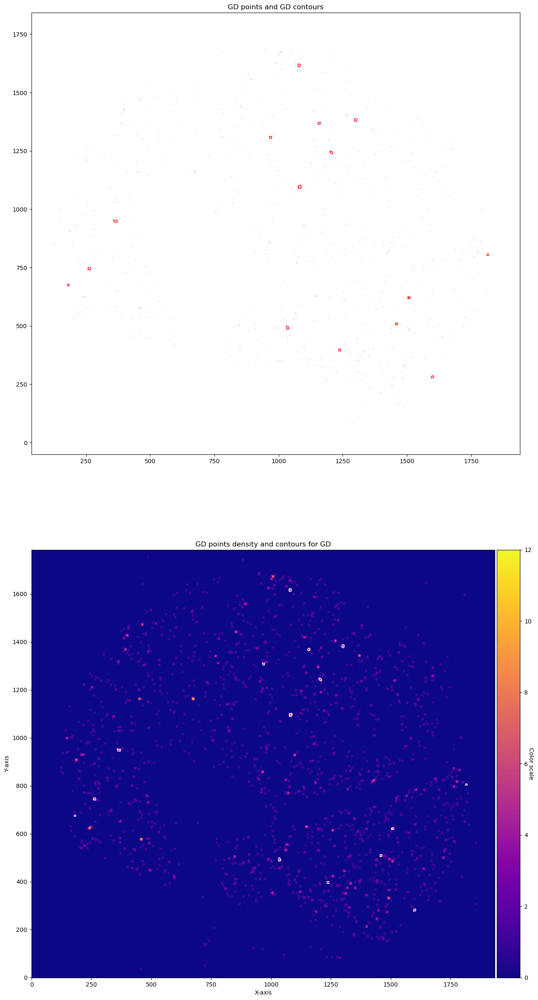

In [8]:
fig, axs = plt.subplots(2, 1, figsize=(15, 30))

CGD.plot_contours_scatter(path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
                              c_points='blue', c_contours='red', ax=axs[0])
axs[0].set_title('GD points and GD contours')

CGD.plot_conv_sum(cmap='plasma', c_countour='white', path=None, ax=axs[1])
axs[1].set_title('GD points density and contours for GD')

plt.show()

We can derive the Masks of the GD contours now. We will also expand these masks to be able to see what is around these points. 

The expansions will be of 10 20 and 30 um that correspond to the same in pixels 

INFO:GRIDGEN.src.masks:Tumour mask not defined.
INFO:GRIDGEN.src.masks:Stroma mask not defined.
INFO:GRIDGEN.src.masks:Mask for objects created with exclusions: None. Pixels of objects inside None were removed
INFO:GRIDGEN.src.masks:creating non overlaping tumour and stroma mask of single object analysis. 


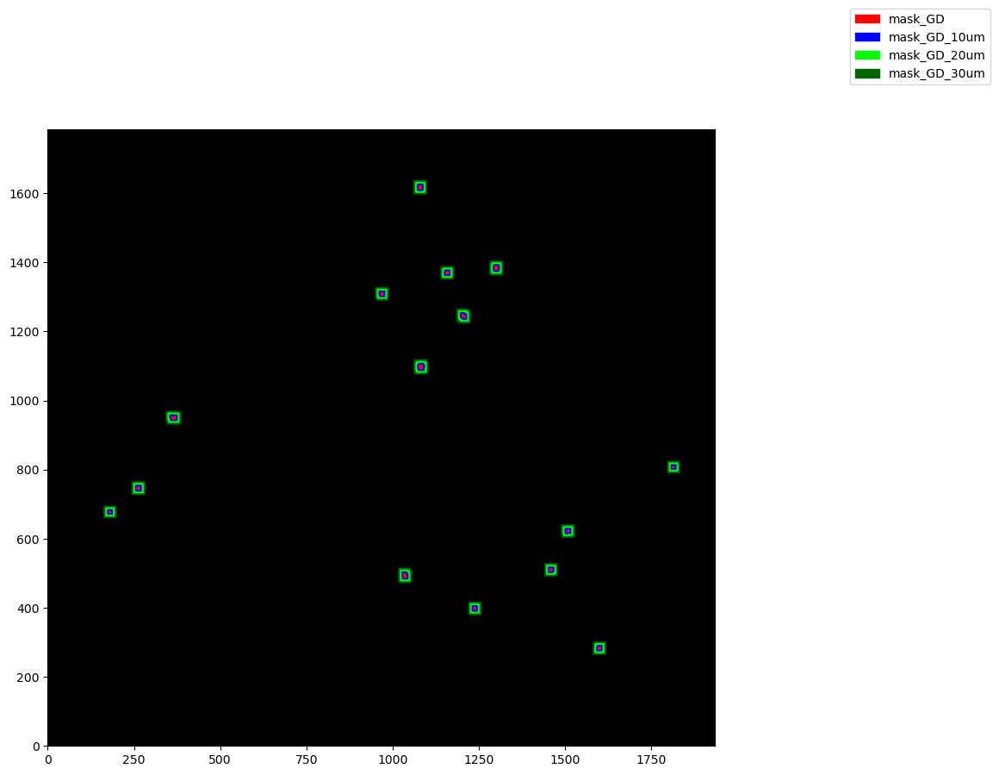

In [9]:
# ### single object analysis GD
GM = masks.GetMasks(image_shape=(height, width))

SA = masks.SingleClassObjectAnalysis(GM, contours_object=CGD.contours)
SA.get_mask_objects(exclude_masks=None)  # Not excluding any tum or empty 

SA.get_objects_expansion(expansions_pixels=[10, 20, 30],
                         exclude_masks=None)  # exclude from empty? or from tumour? Not excluding

mask_GD_10um, mask_GD_20um, mask_GD_30um = SA.masks_object_expansions
mask_GD = SA.mask_object_SA


# Define the masks, their names and colors 
masks_plot = [mask_GD, mask_GD_10um, mask_GD_20um, mask_GD_30um]
mask_names = ['mask_GD','mask_GD_10um', 'mask_GD_20um', 'mask_GD_30um']
mask_colors = {
    'mask_GD': (255, 0, 0),          # red
    'mask_GD_10um': (0, 0, 255),     # blue
    'mask_GD_20um':  (0, 255, 0),     # green
    'mask_GD_30um':(0, 100, 0),     # dark green
}


GM.plot_masks(masks=masks_plot,
              mask_names=mask_names,
              background_color=(1, 1, 1),
              mask_colors=mask_colors, path=None, show=True, ax=None)
plt.show()  

We can analyse the masks now. 
However, would be useful to get the Tumour and Stroma annotations. 
We can combine the analyses. For this one would:

    * Define the GD objects (done above), 
    * Define the Tumour, Stroma and Empty areas 
    * obtain the masks and the expansions of GD 
    * plot the GD objects in relation to Tumour and Stroma areas 

==== tumour ====
total contours found  141
total contours after filtering by area 29
====
total contours found  163
total contours after filtering by area 52


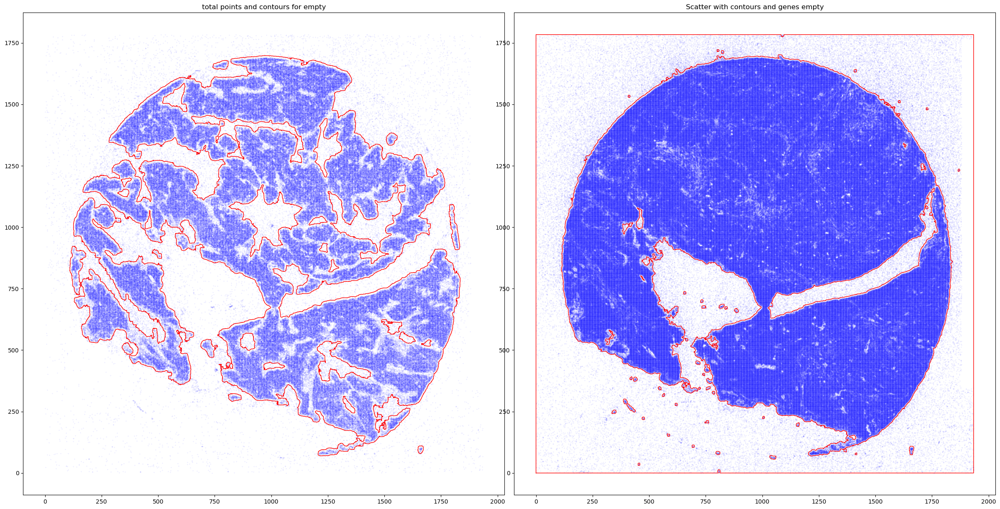

In [10]:
# defined with the gene list 
target_tum = ['EPCAM', 'SMIM22','CLDN3', 'KRT18','LGALS4', 'KRT8', 'ELF3','TSPAN8', 'STMN1', 'CD47', 'MYC', 'LGALS3'] 

# param tum
density_th_tum = 25    # 50
min_area_th_tum =  500 #1000    
kernel_size_tum = 20   # 20

# param empty
density_th_empty = 20
min_area_th_empty = 50 #400
kernel_size_empty = 10


# define the tumour array ( the one missing) 
df_subset_tum, array_subset_tum, target_indices_subset_tum = ga.get_subset_arrays(df_total, array_total,target_dict_total,
                                                                         target_list=target_tum, target_col = 'target')

# obtain contours 
CTum = contours.GetContour(array_subset_tum, contour_name='tum')
CTum.get_conv_sum(kernel_size=kernel_size_tum, kernel_shape='square')
CTum.contours_from_sum(density_threshold = density_th_tum,
                       min_area_threshold = min_area_th_tum , directionality = 'higher')

CEmpty = contours.GetContour(array_total, contour_name='empty')
CEmpty.get_conv_sum(kernel_size=kernel_size_empty, kernel_shape='square')
CEmpty.contours_from_sum(density_threshold = density_th_empty,
                       min_area_threshold = min_area_th_empty, directionality = 'lower') # attention that directionality is lower here 

print('==== tumour ====')
print('total contours found ', CTum.total_valid_contours)
print('total contours after filtering by area', CTum.contours_filtered_area)

print('====')
print('total contours found ', CEmpty.total_valid_contours)
print('total contours after filtering by area', CEmpty.contours_filtered_area)

# PLOTs -- instead of plotting just with the function for example: CTum.plot_contours_scatter, we will make a composite image 

fig, axs = plt.subplots(1, 2, figsize=(30, 15))
CTum.plot_contours_scatter(path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
                           c_points= 'blue',c_contours= 'red', ax=axs[0])
axs[0].set_title('Tum points and tum contours')  


CEmpty.plot_contours_scatter(path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
                           c_points= 'blue',c_contours= 'red', ax=axs[1])
axs[0].set_title('total points and contours for empty')  
plt.subplots_adjust(wspace=0.02)  # Adjust to your preference

plt.show()

We will define the masks. As we want to update the Tumour and Stroma masks in relation to the GD objects we will redo the masks definition function. 

INFO:GRIDGEN.src.masks:Filtering stroma mask by area: 700
INFO:GRIDGEN.src.masks:Filtering mask by area: 700
INFO:GRIDGEN.src.masks:Mask for objects created with exclusions: None. Pixels of objects inside None were removed
INFO:GRIDGEN.src.masks:creating non overlaping tumour and stroma mask of single object analysis. 
INFO:GRIDGEN.src.masks:creating non overlaping tumour mask of single object analysis. 
INFO:GRIDGEN.src.masks:creating non overlaping stroma mask of single object analysis. 
INFO:GRIDGEN.src.masks:creating non overlaping tumour mask of single object analysis. 
INFO:GRIDGEN.src.masks:creating non overlaping stroma mask of single object analysis. 
INFO:GRIDGEN.src.masks:creating non overlaping tumour mask of single object analysis. 
INFO:GRIDGEN.src.masks:creating non overlaping stroma mask of single object analysis. 


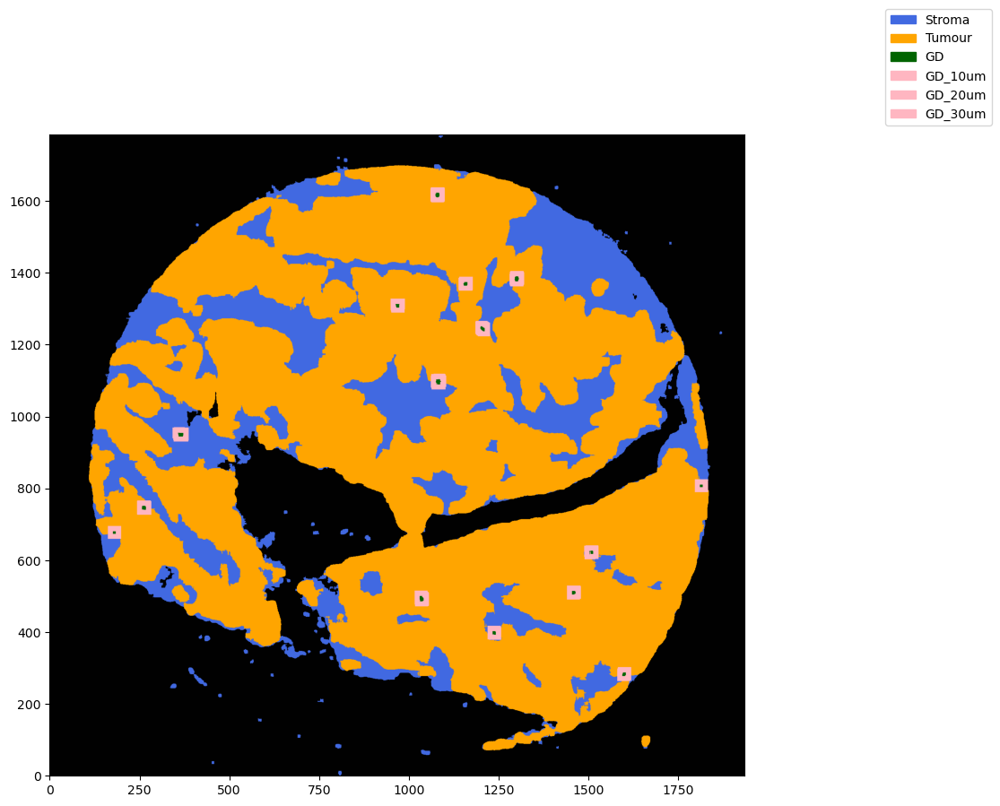

In [11]:
# tumour and Stroma masks 
GM = masks.GetMasks(image_shape=(height, width))
GM.get_masks_T_S_empty(contours_tum=CTum.contours, contours_empty=CEmpty.contours, filter_area=700)
# general masks
mask_stroma_overall = GM.mask_S
mask_tumour_overall = GM.mask_T


# ### single object analysis GD
SA = masks.SingleClassObjectAnalysis(GM, contours_object=CGD.contours)
SA.get_mask_objects(exclude_masks=None)  # Not excluding any tum or empty 

SA.get_objects_expansion(expansions_pixels=[10, 20, 30],
                         exclude_masks=None)  # exclude from empty? or from tumour? Not excluding

mask_GD_10um, mask_GD_20um, mask_GD_30um = SA.masks_object_expansions
mask_GD = SA.mask_object_SA
mask_stroma = SA.mask_S_SA  # it is without the GD and exansions area 
mask_tum = SA.mask_T_SA




# Define the masks and their names
masks_plot = [mask_stroma, mask_tum,mask_GD, mask_GD_10um, mask_GD_20um, mask_GD_30um]
mask_names = ['Stroma', 'Tumour', 'GD', 'GD_10um', 'GD_20um', 'GD_30um']

mask_colors = {
    'Stroma': np.array([65, 105, 225]),  # Royal Blue
    'Tumour':  np.array([255, 165, 0]),  # Orange, 
    'GD': np.array([0, 100, 0]),  # Light Green
    'GD_10um': np.array([255, 182, 193]),  # Light Pink
    'GD_20um': np.array([255, 182, 193]),  # Light Pink
    'GD_30um': np.array([255, 182, 193])   # Light Pink
}

GM.plot_masks(masks=masks_plot,
              mask_names=mask_names,
              background_color=(1, 1, 1),
              mask_colors=mask_colors, path=None, show=True, ax=None)
plt.show()  

We can now extract information the same way that we did for Tumour/Stroma. 

We can do this either by agglomerating all the objects or do it by object.

agglomerating all objects. In this approach, all the objects are agglomerated. Hierarcy and tumour/stroma annotations are not derived. 

In [12]:
masks_analysis_tb = [
        {'mask': mask_stroma, 'mask_name': 'Stroma', 'per_object': False, 'level_hierarchy': None},
        {'mask': mask_tum, 'mask_name': 'Tumour', 'per_object': False, 'level_hierarchy': None},
        {'mask': mask_GD, 'mask_name': 'mask_GD', 'per_object': False, 'level_hierarchy': 1},
        {'mask': mask_GD_10um, 'mask_name': 'mask_GD_10um', 'per_object': False, 'level_hierarchy': 2},
        {'mask': mask_GD_20um, 'mask_name': 'mask_GD_20um', 'per_object': False, 'level_hierarchy': 2},
        {'mask': mask_GD_30um, 'mask_name': 'mask_GD_30um', 'per_object': False, 'level_hierarchy': 2},
    ]

GP = GetMasksProperties(masks_dict = masks_analysis_tb,array_counts = array_total,
                        target_dict = target_dict_total,
                        logger = logger, image_shape = (height, width), save_path = None)

final_result = GP.get_gene_counts()
final_result

2024-11-08 10:35:59,146 - contour_logger - INFO - The run method took 10.295721769332886 seconds (0.17159536282221477 minutes) to execute
INFO:contour_logger:The run method took 10.295721769332886 seconds (0.17159536282221477 minutes) to execute


,mask_name,object_id,area,perimeter,centroid,min_x,min_y,max_x,max_y,vertices,...,SFTPD,IFNE,TRDV1,CCL13,IFNB1,VPREB3,CCL1,ELANE,IGHE,per_object
0,Stroma,0,435942.0,36781.640421,"(971.5430722435553, 1026.454227855999)",0,115,1785,1873,435942,...,5,28,6,22,5,1,10,10,2,False
1,Tumour,0,1402233.0,34500.187356,"(1027.6053530333404, 928.9552927366565)",70,110,1700,1836,1402233,...,33,64,7,51,19,3,25,10,3,False
2,mask_GD,0,1570.0,570.302561,"(1057.4229299363058, 944.7152866242038)",277,177,1623,1819,1570,...,1,0,0,0,0,0,0,0,0,False
3,mask_GD_10um,0,4222.0,1773.49347,"(1077.1774040738985, 920.6641402179062)",273,173,1628,1824,4222,...,0,1,0,0,1,0,0,0,0,False
4,mask_GD_20um,0,7520.0,2900.215295,"(1079.2912234042553, 912.9321808510638)",268,168,1633,1829,7520,...,0,0,0,0,0,0,1,0,0,False
5,mask_GD_30um,0,10520.0,4100.215295,"(1080.7576045627377, 909.1777566539924)",263,163,1638,1834,10520,...,0,0,0,0,0,0,1,0,0,False


It is more interesting though, to do this analysis considering each individual object of GD as single.

This way we can also annotate how many pixels of the GD falls into regions identified indepedently as tumour and stroma. Because the tumour and stroma defined above are excluding the objects, we will use the base masks stroma and tumour. 

We can also derive the hierarchy of these objects, so the expansions of the GD are linked to which object they belong. 

In [13]:
masks_analysis_tb = [
        {'mask': mask_stroma, 'mask_name': 'Stroma', 'per_object': False, 'level_hierarchy': None, 'annotation': 1},
        {'mask': mask_tum, 'mask_name': 'Tumour', 'per_object': False, 'level_hierarchy':None,  'annotation': 1},
        {'mask': mask_GD, 'mask_name': 'mask_GD', 'per_object': True, 'level_hierarchy': 1,  'annotation': 2},
        {'mask': mask_GD_10um, 'mask_name': 'mask_GD_10um', 'per_object': True, 'level_hierarchy': 2, 'annotation': 2},
        {'mask': mask_GD_20um, 'mask_name': 'mask_GD_20um', 'per_object': True, 'level_hierarchy': 2, 'annotation': 2},
        {'mask': mask_GD_30um, 'mask_name': 'mask_GD_30um', 'per_object': True, 'level_hierarchy': 2, 'annotation': 2},
    ]

GP = GetMasksProperties(masks_dict = masks_analysis_tb,array_counts = array_total,
                        target_dict = target_dict_total,
                        logger = logger, image_shape = (height, width), save_path = None)


base_mask_dict =  [
        {'mask': mask_stroma_overall, 'mask_name': 'Stroma_overall'},
        {'mask': mask_tumour_overall, 'mask_name': 'Tumour_overall'},]

final_result = GP.get_mask_interest_annotations(base_mask_dict)
final_result

2024-11-08 10:35:59,441 - contour_logger - INFO - Running annotation analysis
INFO:contour_logger:Running annotation analysis
2024-11-08 10:35:59,442 - contour_logger - INFO - Label Mask Stroma_overall is empty. Labelling.
INFO:contour_logger:Label Mask Stroma_overall is empty. Labelling.
2024-11-08 10:35:59,767 - contour_logger - INFO - Label Mask Tumour_overall is empty. Labelling.
INFO:contour_logger:Label Mask Tumour_overall is empty. Labelling.
2024-11-08 10:36:00,108 - contour_logger - INFO - The annotation analysis took 0.67 seconds to execute
INFO:contour_logger:The annotation analysis took 0.67 seconds to execute


,mask_name,object_id,Stroma_overall_pixels,Stroma_overall_ids,Tumour_overall_pixels,Tumour_overall_ids
0,Stroma,0,NaN,NaN,NaN,NaN
1,Tumour,0,NaN,NaN,NaN,NaN
2,mask_GD,1,50,[10],6,[1]
3,mask_GD_10um,1,146,[10],70,[1]
4,mask_GD_20um,1,235,[10],195,[1]
...,...,...,...,...,...,...
57,mask_GD_30um,14,259,[173],421,[2]
58,mask_GD,15,0,[],56,[2]
59,mask_GD_10um,15,4,[203],212,[2]
60,mask_GD_20um,15,82,[203],348,[2]


We can add the counts

In [14]:
final_result = GP.get_gene_counts()
final_result

2024-11-08 10:37:40,752 - contour_logger - INFO - The run method took 100.62703895568848 seconds (1.6771173159281412 minutes) to execute
INFO:contour_logger:The run method took 100.62703895568848 seconds (1.6771173159281412 minutes) to execute


,mask_name,object_id,Stroma_overall_pixels,Stroma_overall_ids,Tumour_overall_pixels,Tumour_overall_ids,area,perimeter,centroid,min_x,...,SFTPD,IFNE,TRDV1,CCL13,IFNB1,VPREB3,CCL1,ELANE,IGHE,per_object
0,Stroma,0,NaN,NaN,NaN,NaN,435942.0,36781.640421,"(971.5430722435553, 1026.454227855999)",0,...,5,28,6,22,5,1,10,10,2,False
1,Tumour,0,NaN,NaN,NaN,NaN,1402233.0,34500.187356,"(1027.6053530333404, 928.9552927366565)",70,...,33,64,7,51,19,3,25,10,3,False
2,mask_GD,1,50,[10],6,[1],56.0,26.0,"(180.5, 676.0)",673,...,0,0,0,0,0,0,0,0,0,True
3,mask_GD_10um,1,146,[10],70,[1],216.0,93.656854,"(181.12962962962962, 676.6296296296297)",669,...,0,0,0,0,0,0,0,0,0,True
4,mask_GD_20um,1,235,[10],195,[1],430.0,169.656854,"(181.0, 676.5)",664,...,0,0,0,0,0,0,0,0,0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,mask_GD_30um,14,259,[173],421,[2],680.0,266.142136,"(1600.0220588235295, 281.9779411764706)",263,...,0,0,0,0,0,0,0,0,0,True
58,mask_GD,15,0,[],56,[2],56.0,26.0,"(1814.5, 806.0)",803,...,0,0,0,0,0,0,0,0,0,True
59,mask_GD_10um,15,4,[203],212,[2],216.0,93.656854,"(1815.1296296296296, 806.6296296296297)",799,...,0,0,0,0,0,0,0,0,0,True
60,mask_GD_20um,15,82,[203],348,[2],430.0,169.656854,"(1815.0, 806.5)",794,...,0,0,0,0,0,0,0,0,0,True


how this relates to cell segmentation? 

In [15]:
parts = os.path.basename(file_csv).split('_') 
# Extract the desired part (assuming it's the third part)
selection_part = '_'.join(parts[:2])

tma = parts[0]
selection = parts[1]

Grab cell segmentation

In [17]:
cells_prior07 = '../../xenium/HLA_analysis/cell_segmentation/cells_prior07'
#get the name part
seg_name = f'{tma}_{selection.replace(" ", "")}/segmentation_polygons.json'
seg_path = os.path.join(cells_prior07, seg_name)
print(seg_path)
with open(seg_path, 'r') as file:
    geojson_data = json.load(file)


selection_coord_hla2 = f'../../xenium_data/HLA/HLA_TMA2/coordinates_HLA2.csv'
selection_coord_hla1 = f'../../xenium_data/HLA/GD_TMA1_S3/coordinates_HLA1.csv'

coordinates_selection = pd.read_csv(selection_coord_hla1)
coordinates_selection = coordinates_selection.loc[coordinates_selection['Selection'].str.replace(" ", "")==selection]
min_x= min(coordinates_selection['X'])
min_y= min(coordinates_selection['Y'])

../../xenium/HLA_analysis/cell_segmentation/cells_prior07/TMA1_Selection25/segmentation_polygons.json


grab adata and subsampled

In [18]:
import anndata as ad
name_adata = "../../xenium/HLA_analysis/cell_prior07_v24_09.h5ad"
# adata.write(name_adata)
adata = ad.read_h5ad(name_adata)
adata_sample = adata[(adata.obs['XENIUM_TMA'] == tma) & (adata.obs['Selection'].str.replace(" ","") == selection)]
# Extract cell type and cell ID from the adata object
cell_ids = adata_sample.obs['Name'].apply(lambda x: int(re.search(r'-(\d+)', x).group(1)))
cell_types = adata_sample.obs['annotation_final_simpler']
# categorical_data = dict(zip(cell_ids, cell_types))

# draw_categorical(seg_json, categorical_data)
# plot_legend(color_mapping)
adata_sample

View of AnnData object with n_obs × n_vars = 18506 × 480
    obs: 'Name', 'area', 'avg_assignment_confidence', 'avg_confidence', 'cluster', 'density', 'elongation', 'lifespan', 'max_cluster_frac', 'n_transcripts', 'x', 'y', 'XENIUM_TMA', 'Selection', 'annotation', 'Hes', 'TMA', 'COSMX selection', 'Case', 'Block', 'Unnamed: 8', 'MMR', 'HLA', 'B2M abcam', 'IHC group', 'B2M gene defect', 'Final group', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'sample_ID', 'res_0.330it', 'res_0.530it', 'res_0.730it', 'res_130it', 'res_0.3', 'res_1', 'annotation_level0', 'epi_proportion', 'annotation_level1', 'annotation_level1_simpler', 'annotation_level2', 'annotation_level3', 'annotation_level3_refined', 'annotation_final_simpler'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts',

plot the polygons with points of genes of interest 


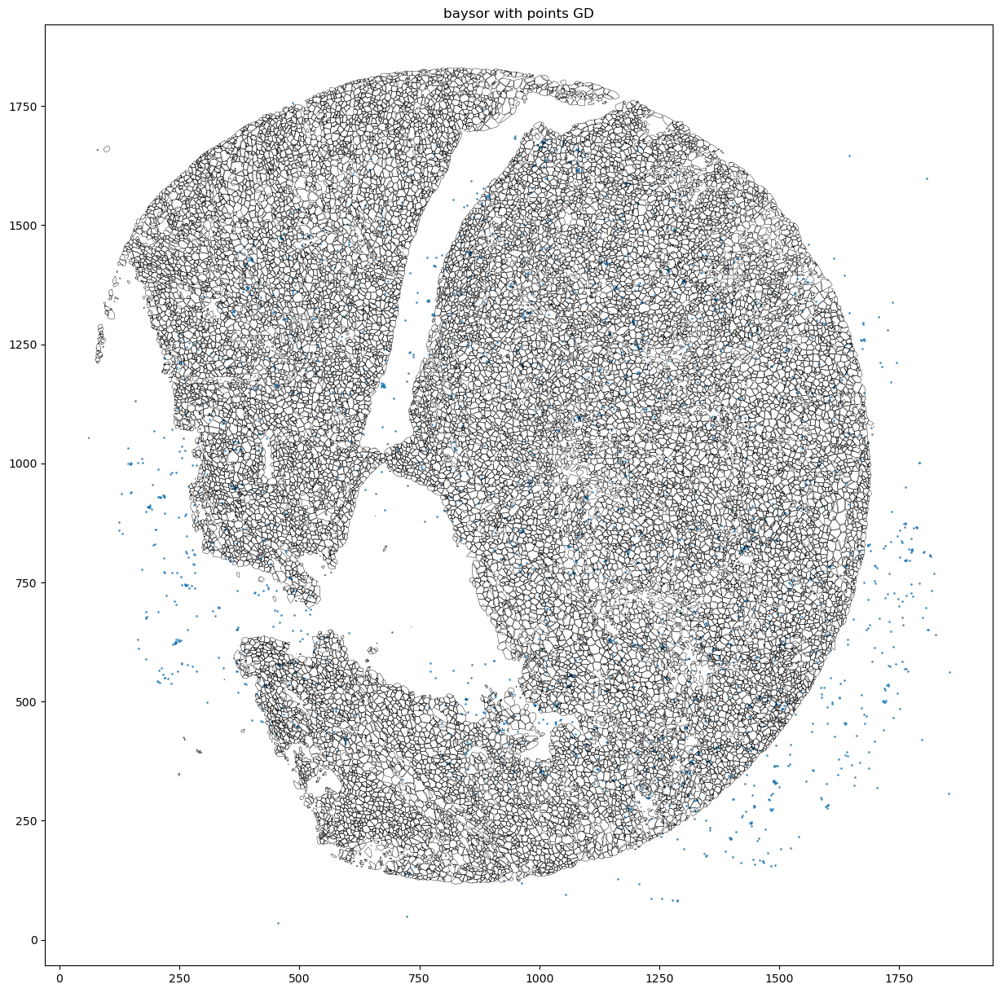

In [19]:
def plot_df_coord_xenium_with_points(geojson_data, df_transcript, genes_of_interest, min_x, min_y, title):
    # Create a figure with three subplots
    fig, ax = plt.subplots(1, 1, figsize=(15, 15))

    polygons_baysor_cellprior = [geometry['coordinates'][0] for geometry in geojson_data['geometries']]    
    for polygon in polygons_baysor_cellprior:
        polygon = np.array(polygon)
        # if min_x is not None and min_y is not None:
        polygon = polygon - np.array([min_x, min_y])  # Shift the polygon coordinates
        plt.plot(polygon[:, 1], polygon[:, 0], color='black', linewidth=0.3)
    
    df_sc = df_transcript.loc[df_transcript['target'].isin(genes_of_interest)]
    plt.scatter( df_sc['X'], df_sc['Y'], s = 1, alpha = 0.7)
    plt.title(title)
    plt.show()


plot_df_coord_xenium_with_points(geojson_data, df_total,
                                 genes_of_interest = ['TRGC1','TRGC2','TRDC'],
                                 min_x = min_x,
                                 min_y=min_y,
                                 title = 'baysor with points GD')

plot the polygons with the cells that pass the rules that we defined 

1713
1638


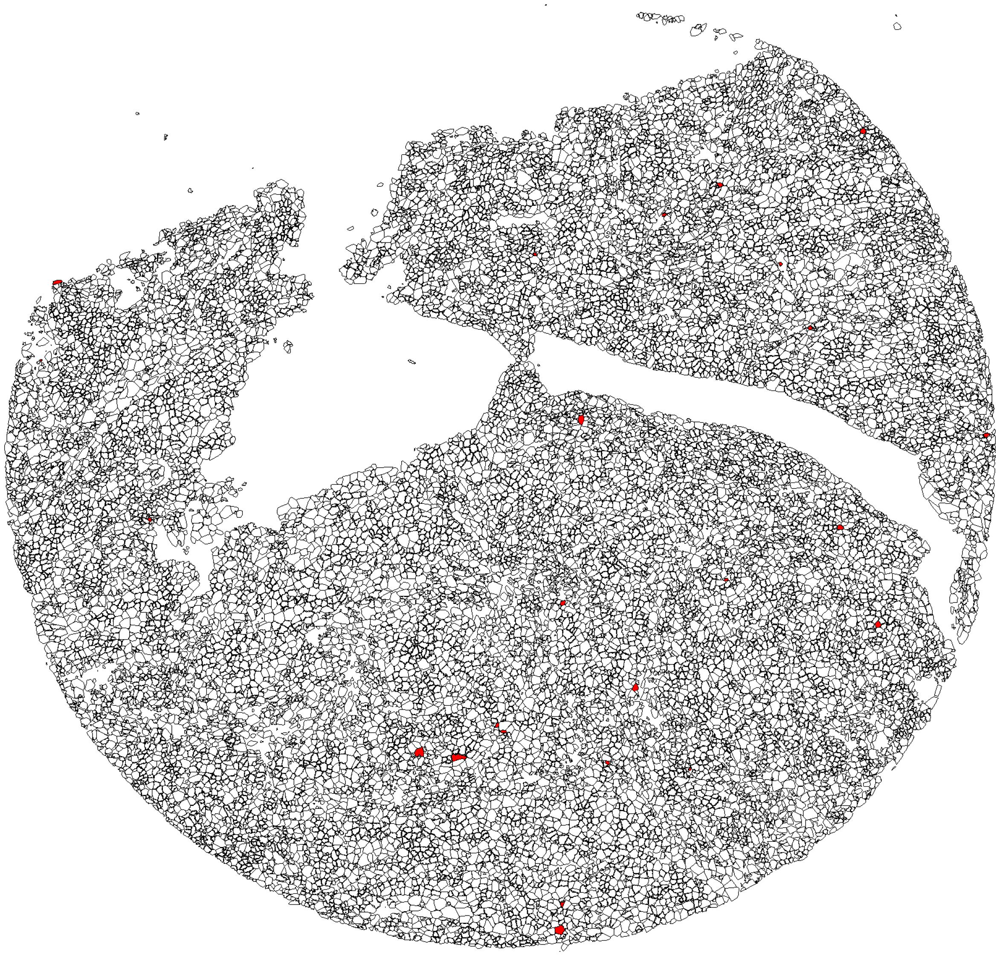

In [59]:

def plot_df_coord_xenium_conditions(geojson_data, adata_sample, title):
    gene_data_df = pd.DataFrame({
        'cell_id': adata_sample.obs['cell_id'],
        'label': adata_sample.obs['annotation_final_simpler'],
        'TRGC1': adata_sample[:, 'TRGC1'].X.toarray().flatten(),
        'TRGC2': adata_sample[:, 'TRGC2'].X.toarray().flatten(),
        'TRDC': adata_sample[:, 'TRDC'].X.toarray().flatten(),
        'TRBC1': adata_sample[:, 'TRBC1'].X.toarray().flatten(),
        'TRBC2': adata_sample[:, 'TRBC2'].X.toarray().flatten(),
        'TRAC': adata_sample[:, 'TRAC'].X.toarray().flatten(),
    })

    genes_that_pass_threshold = []
     # Initialize min and max values for x and y
    min_x, min_y = math.inf, math.inf
    max_x, max_y = 0,0

    # Extract coordinates from the GeoJSON
    for feature in geojson_data["geometries"]:
        polygon_coordinates = feature["coordinates"][0]
        for point in polygon_coordinates:
            x, y = point
            max_x = max(max_x, x)
            max_y = max(max_y, y)
            min_x = min(min_x, x)
            min_y = min(min_y, y)
    # Calculate width and height
    width = int(max_x - min_x)
    height = int(max_y - min_y)
    print(width)
    print(height)

    image_categorical = Image.new("RGB", (width, height), "white")
    draw_categorical = ImageDraw.Draw(image_categorical)

    cell_id_map = {cell_id: idx for idx, cell_id in enumerate(adata_sample.obs['cell_id'])}

    polygon_dicts = geojson_data["geometries"]
    for i in range(len(polygon_dicts)):
        polygon_coordinates = geojson_data["geometries"][i]["coordinates"][0]
        # polygon_coordinates = [coord for point in polygon_coordinates for coord in point]
        polygon_coordinates =  [(point[0] - min_x, point[1] - min_y) for point in polygon_coordinates]
        if len(polygon_coordinates)<3:
            continue

        cell_id = geojson_data["geometries"][i]["cell"]
        cell_idx = cell_id_map.get(cell_id, None)

        cell_data = adata_sample[adata_sample.obs['cell_id']==cell_id]
        if cell_idx is None:
            continue
        cell_data = gene_data_df.iloc[cell_idx]
        trgc_sum = cell_data['TRGC1'] + cell_data['TRGC2']
        trdc = cell_data['TRDC']
        trbc_sum = cell_data['TRBC1'] + cell_data['TRBC2']
        trac = cell_data['TRAC']
        label = cell_data['label']
    
        # Conditions
        condition1 = trgc_sum > 0
        condition2 = trdc > 0
        condition3 = (trgc_sum + trdc) > (trbc_sum + trac)
        
        # Determine if conditions are met
        if condition1 and condition2 and condition3:
            fill_color = "red"
            genes_that_pass_threshold.append(cell_data)
        else:
            fill_color = "white"
        draw_categorical.polygon(polygon_coordinates, outline="black", fill=fill_color)
    
    plt.figure(figsize=(30, 30))
    plt.imshow(image_categorical)
    plt.axis('off')  # Hide the axes
    plt.show()
    return genes_that_pass_threshold


genes_that_pass_threshold = plot_df_coord_xenium_conditions(geojson_data, adata_sample, title = '')


In [60]:
genes_that_pass_threshold = pd.DataFrame(genes_that_pass_threshold)
print(genes_that_pass_threshold.shape)
genes_that_pass_threshold

(24, 8)


,cell_id,label,TRGC1,TRGC2,TRDC,TRBC1,TRBC2,TRAC
CRf7900b788-2_24,2,Fibroblasts,0.000000,1.023577,0.637405,0.0,0.637405,0.637405
CRf7900b788-2723_24,2723,Tcell,0.000000,0.908259,1.693779,0.0,0.908259,0.000000
CRf7900b788-18425_24,18425,Epithelial,0.000000,0.576022,1.735839,0.0,0.576022,0.000000
CRf7900b788-16711_24,16711,Tip-like vascular,0.000000,0.255679,0.628084,0.0,0.000000,0.000000
CRf7900b788-12367_24,12367,Epithelial,0.178572,0.000000,0.178572,0.0,0.000000,0.000000
CRf7900b788-15069_24,15069,immune_contaminated,0.000000,1.039273,1.868949,0.0,0.000000,0.000000
CRf7900b788-12395_24,12395,Fibroblasts,0.847298,0.000000,0.847298,0.0,0.000000,0.000000
CRf7900b788-8967_24,8967,GD_NK_others,1.192277,0.764205,1.192277,0.0,0.764205,0.000000
CRf7900b788-10781_24,10781,Tip-like vascular,0.610260,0.610260,0.610260,0.0,0.000000,0.000000
CRf7900b788-11474_24,11474,Tip-like vascular,0.000000,0.296385,0.296385,0.0,0.000000,0.296385


plot GD NK cells annotation 

1713
1638


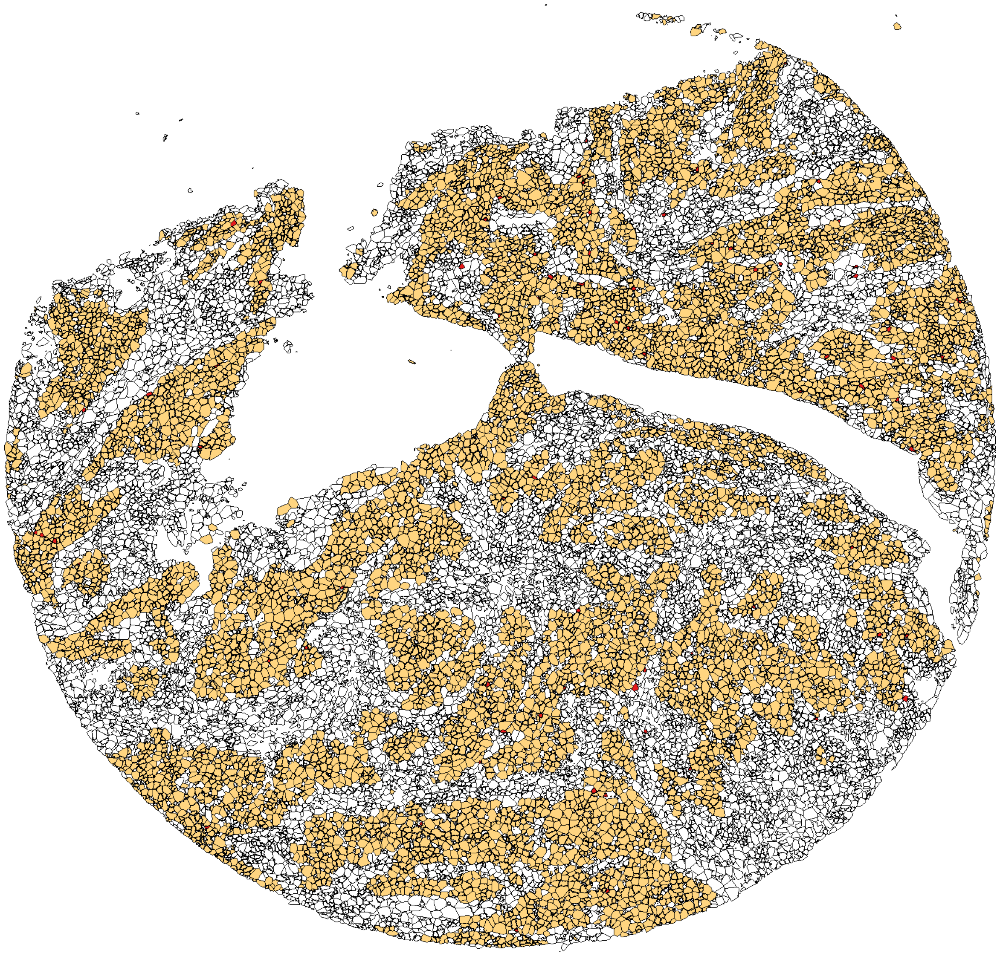

In [37]:
# plot GD NK cells annotation 


# plot the polygons with the cells that pass the rules that we defined 
color_mapping = {
    "Epithelial": "#FFD580",  # light yellow
    
    # "Fibroblasts": '#377eb8',  # blue
    # 'Myofibroblasts/VSMCs/perycites': '#8c564b',  # brown
    # 'Glial cells': '#bcbd22',  # yellow-green
    # 'Tip-like vascular': '#17becf',  # cyan
    
    # "Macrophages": '#984ea3',  # purple
    # "Macrophages/DC": '#6a3d9a',  # dark purple
    # 'Monocytes': '#dabaff',  # light purple
    # 'Monocytes/Neutrophils': '#ffbb78',  # light orange
    
    # "Tcell": '#4daf4a',  # green
    # "Tcell_CD8": '#377eb8',  # blue
    # 'Tcell_CD4': '#a6cee3',  # light blue
    'GD_NK_others': '#f781bf',  # pink
    
    # "PlasmaBcells": '#ff7f00',  # orange
    # "Bcells": '#e41a1c',  # red

    # 'other immune/undefined': '#999999',  # grey
    # 'contaminated': '#7f7f7f',  # dark grey
    # 'immune_contaminated': '#c7c7c7',  # light grey
}

def draw_categorical(geojson_data, categorical_data):

    # Initialize min and max values for x and y
    min_x, min_y = math.inf, math.inf
    max_x, max_y = 0,0

    # Extract coordinates from the GeoJSON
    for feature in geojson_data["geometries"]:
        polygon_coordinates = feature["coordinates"][0]
        for point in polygon_coordinates:
            x, y = point
            max_x = max(max_x, x)
            max_y = max(max_y, y)
            min_x = min(min_x, x)
            min_y = min(min_y, y)
    # Calculate width and height
    width = int(max_x - min_x)
    height = int(max_y - min_y)
    print(width)
    print(height)

    image_categorical = Image.new("RGB", (width, height), "white")
    draw_categorical = ImageDraw.Draw(image_categorical)


    polygon_dicts = geojson_data["geometries"]
    for i in range(len(polygon_dicts)):
        polygon_coordinates = geojson_data["geometries"][i]["coordinates"][0]
        # polygon_coordinates = [coord for point in polygon_coordinates for coord in point]
        polygon_coordinates =  [(point[0] - min_x, point[1] - min_y) for point in polygon_coordinates]
        if len(polygon_coordinates)<3:
            continue

        cell_id = geojson_data["geometries"][i]["cell"]
        # Extract categorical value for the cell from your data
        categorical_value = categorical_data.get(cell_id, "Unknown")  # If not gets unknown

        # Get the color from the color mapping dictionary
        categorical_color = color_mapping.get(categorical_value, "white") # If the categorical value is not found in the mapping, it defaults to "white."

        # Draw the filled polygon with the categorical color
        draw_categorical.polygon(polygon_coordinates, outline="black", fill=categorical_color)
    
    plt.figure(figsize=(30, 30))
    plt.imshow(image_categorical)
    plt.axis('off')  # Hide the axes
    plt.show()
    
# Extract cell type and cell ID from the adata object
cell_ids = adata_sample.obs['Name'].apply(lambda x: int(re.search(r'-(\d+)', x).group(1)))
cell_types = adata_sample.obs['annotation_final_simpler']
categorical_data = dict(zip(cell_ids, cell_types))
draw_categorical(geojson_data, categorical_data)
cell_types = adata_sample.obs['annotation_final_simpler']


In [41]:
# Count the number of 'GD_NK_others'
gd_nk_others_count = (cell_types == 'GD_NK_others').sum()

# Count the total number of cells
total_cells_count = cell_types.size

print(f"Number of 'GD_NK_others': {gd_nk_others_count}")
print(f"Total number of cells: {total_cells_count}")

Number of 'GD_NK_others': 85
Total number of cells: 18506


# Use the same approach to find CD8a regions 

define parameters

In [63]:
target_cd8 = ['CD8A', 'TRBC1', 'TRBC2', 'TRAC']
density_th_cd8 = 3
min_area_th_cd8 = 5
kernel_size_cd8 = 10

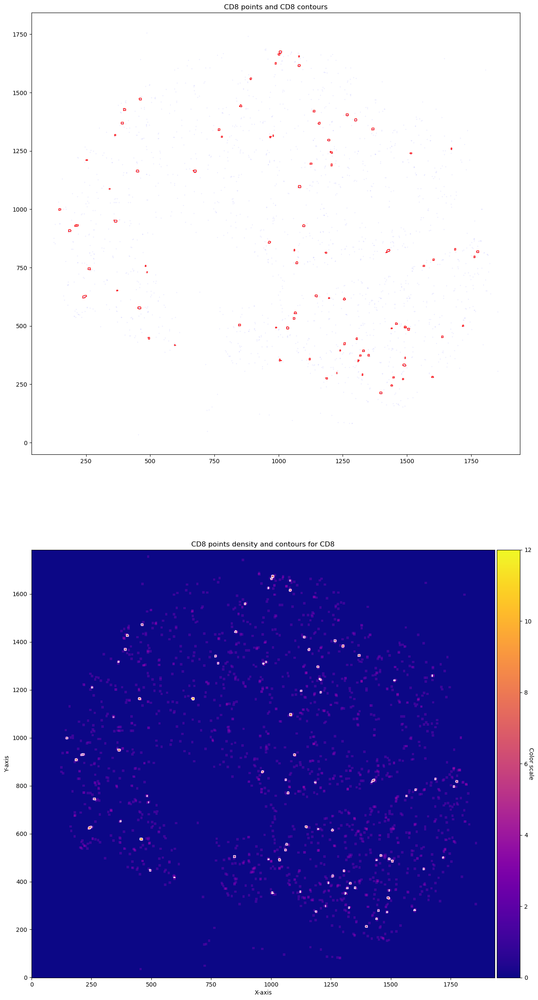

total contours found  150
total contours after filtering by area 150


In [96]:
# creating subsets 
df_subset_cd8, array_subset_cd8, target_indices_subset_cd8 = ga.get_subset_arrays(df_total, array_total,
                                                                                      target_dict_total,
                                                                                      target_list=target_cd8,
                                                                                      target_col='target')
### obtain contours 

CCD8 = contours.GetContour(array_subset_gd, contour_name='CD8a', logger=logger)
CCD8.get_conv_sum(kernel_size=kernel_size_cd8, kernel_shape='square')  
CCD8.contours_from_sum(density_threshold=density_th_cd8,
                      min_area_threshold=min_area_th_cd8, directionality='higher')


fig, axs = plt.subplots(2, 1, figsize=(15, 30))

CCD8.plot_contours_scatter(path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
                              c_points='blue', c_contours='red', ax=axs[0])
axs[0].set_title('CD8 points and CD8 contours')

CCD8.plot_conv_sum(cmap='plasma', c_countour='white', path=None, ax=axs[1])
axs[1].set_title('CD8 points density and contours for CD8')

plt.show()


print('total contours found ', CGD.total_valid_contours)
print('total contours after filtering by area', CGD.contours_filtered_area)

# filtering contours

We will use, isntead of a home made function to filter contours, simple functions that allow to filter contours 
you can use 

    * filter_contours_by_gene_threshold(gene_array, threshold) to compare a gene array (one or multiple - squeezed) if have counts higher or equal than threshold. 
    gene 1 > gene2 --> valid contour 
    
    * filter_contours_by_gene_comparison(gene_array1, gene_array2) to compare two subsets of array where the total count of array 1  needs to > gene 2 to be a valid contour  
    gene 1 > gene2 --> valid contour 



In this particular case we will considered CD8 regions if: 

        * CD8 counts > = 1
        * TRBC1 + TRBC2>= 1 
        * TRAC >=1 
        * sum ('TRBC1', 'TRBC2', 'TRAC') > sum('TRGC1', 'TRGC2', 'TRDC') 

In [97]:
df_subset_cd8_gene, array_subset_cd8_gene, target_indices_subset_cd8_gene = ga.get_subset_arrays(df_total, 
                                                                                                 array_total,
                                                                                      target_dict_total,
                                                                                      target_list= ['CD8A'],
                                                                                      target_col='target')

df_subset_cd4_gene, array_subset_cd4_gene, target_indices_subset_cd4_gene = ga.get_subset_arrays(df_total, 
                                                                                                 array_total,
                                                                                      target_dict_total,
                                                                                      target_list= ['CD4'],
                                                                                      target_col='target')


df_subset_TRBC1_2_gene, array_subset_TRBC1_2_gene, target_indices_subset_TRBC1_2_gene = ga.get_subset_arrays(df_total, 
                                                                                                 array_total,
                                                                                      target_dict_total,
                                                                                      target_list= ['TRBC1','TRBC2'],
                                                                                      target_col='target')



df_subset_TRAC_gene, array_subset_TRAC_gene, target_indices_subset_TRAC_gene = ga.get_subset_arrays(df_total, 
                                                                                                 array_total,
                                                                                      target_dict_total,
                                                                                      target_list= ['TRAC'],
                                                                                      target_col='target')

df_subset_gd, array_subset_gd, target_indices_subset_gd = ga.get_subset_arrays(df_total, array_total,
                                                                               target_dict_total,
                                                                               target_list=['TRGC1', 'TRGC2', 'TRDC'],
                                                                               target_col='target')

df_subset_ab, array_subset_ab, target_indices_subset_ab = ga.get_subset_arrays(df_total, array_total,
                                                                               target_dict_total,
                                                                               target_list=['TRBC1', 'TRBC2', 'TRAC'],
                                                                               target_col='target')






CCD8.filter_contours_by_gene_threshold(gene_array = array_subset_cd8_gene.squeeze(), threshold = 1, gene_name = 'CD8')# >= 1
CCD8.filter_contours_by_gene_threshold(gene_array = array_subset_TRAC_gene.squeeze(), threshold = 1, gene_name = 'TRAC')# >= 1
CCD8.filter_contours_by_gene_threshold(gene_array = np.sum(array_subset_TRBC1_2_gene, axis=-1), threshold = 1, gene_name = 'TRBC1_2')# >= 1

# gene_counts_ab > gene_counts_gd

CCD8.filter_contours_by_gene_comparison(gene_array1 = array_subset_ab, gene_array2 = array_subset_gd,
                                       gene_name1 = "ab", gene_name2 = "gd") # gene 1 > gene2 --> valid contour 


# CD8 > gene counts cd4 
CCD8.filter_contours_by_gene_comparison(gene_array1 = array_subset_cd8_gene, gene_array2 = array_subset_cd4_gene,
                                       gene_name1 = "CD8", gene_name2 = "CD4") # gene 1 > gene2 --> valid contour 

2024-11-08 13:01:18,414 - contour_logger - INFO - Excluding contour 2. Gene CD8 count  0.0 is below threshold 1
INFO:contour_logger:Excluding contour 2. Gene CD8 count  0.0 is below threshold 1
2024-11-08 13:01:18,420 - contour_logger - INFO - Excluding contour 3. Gene CD8 count  0.0 is below threshold 1
INFO:contour_logger:Excluding contour 3. Gene CD8 count  0.0 is below threshold 1
2024-11-08 13:01:18,427 - contour_logger - INFO - Excluding contour 4. Gene CD8 count  0.0 is below threshold 1
INFO:contour_logger:Excluding contour 4. Gene CD8 count  0.0 is below threshold 1
2024-11-08 13:01:18,443 - contour_logger - INFO - Excluding contour 7. Gene CD8 count  0.0 is below threshold 1
INFO:contour_logger:Excluding contour 7. Gene CD8 count  0.0 is below threshold 1
2024-11-08 13:01:18,481 - contour_logger - INFO - Excluding contour 14. Gene CD8 count  0.0 is below threshold 1
INFO:contour_logger:Excluding contour 14. Gene CD8 count  0.0 is below threshold 1
2024-11-08 13:01:18,487 - co

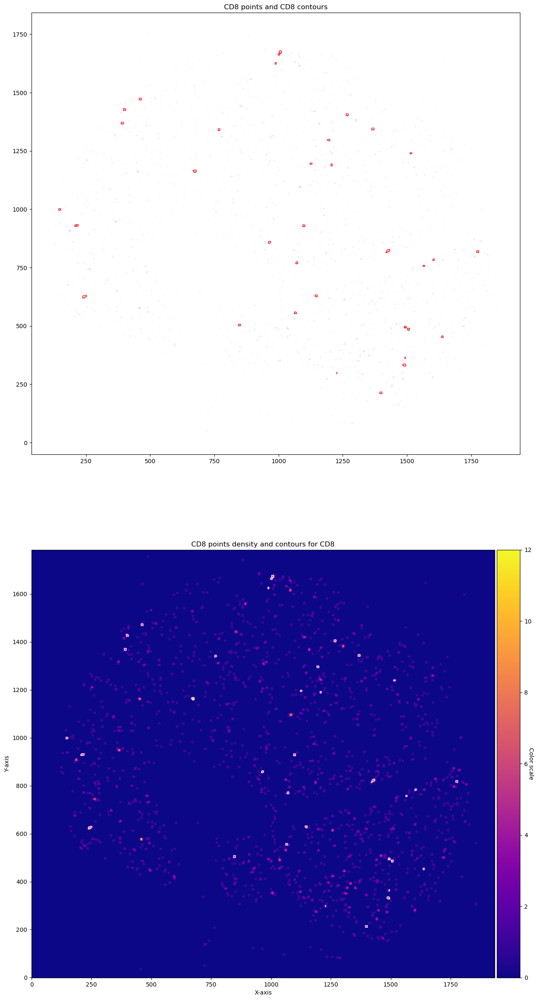

In [98]:
fig, axs = plt.subplots(2, 1, figsize=(15, 30))

CCD8.plot_contours_scatter(path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
                              c_points='blue', c_contours='red', ax=axs[0])
axs[0].set_title('CD8 points and CD8 contours')

CCD8.plot_conv_sum(cmap='plasma', c_countour='white', path=None, ax=axs[1])
axs[1].set_title('CD8 points density and contours for CD8')

plt.show()


masks

INFO:GRIDGEN.src.masks:Filtering stroma mask by area: 700
INFO:GRIDGEN.src.masks:Filtering mask by area: 700
INFO:GRIDGEN.src.masks:Mask for objects created with exclusions: None. Pixels of objects inside None were removed
INFO:GRIDGEN.src.masks:creating non overlaping tumour and stroma mask of single object analysis. 
INFO:GRIDGEN.src.masks:creating non overlaping tumour mask of single object analysis. 
INFO:GRIDGEN.src.masks:creating non overlaping stroma mask of single object analysis. 
INFO:GRIDGEN.src.masks:creating non overlaping tumour mask of single object analysis. 
INFO:GRIDGEN.src.masks:creating non overlaping stroma mask of single object analysis. 
INFO:GRIDGEN.src.masks:creating non overlaping tumour mask of single object analysis. 
INFO:GRIDGEN.src.masks:creating non overlaping stroma mask of single object analysis. 


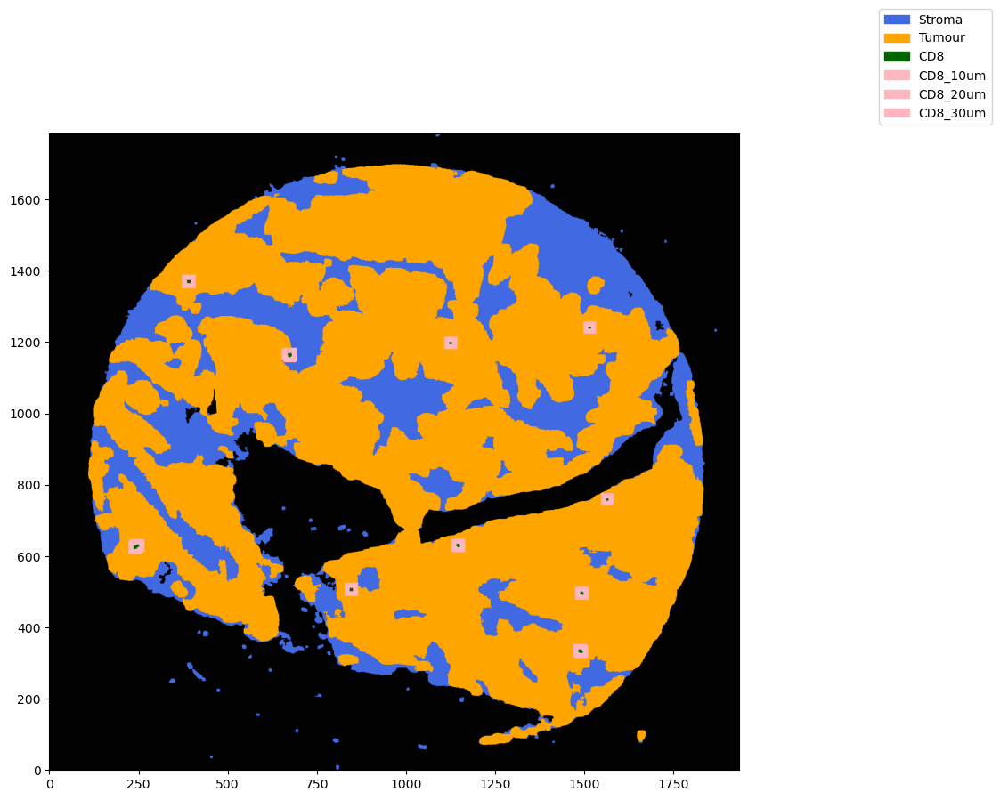

In [89]:
# tumour and Stroma masks 
GM = masks.GetMasks(image_shape=(height, width))
GM.get_masks_T_S_empty(contours_tum=CTum.contours, contours_empty=CEmpty.contours, filter_area=700)
# general masks
mask_stroma_overall = GM.mask_S
mask_tumour_overall = GM.mask_T


# ### single object analysis GD
SA = masks.SingleClassObjectAnalysis(GM, contours_object=CCD8.contours)
SA.get_mask_objects(exclude_masks=None)  # Not excluding any tum or empty 

SA.get_objects_expansion(expansions_pixels=[10, 20, 30],
                         exclude_masks=None)  # exclude from empty? or from tumour? Not excluding

mask_CD8_10um, mask_CD8_20um, mask_CD8_30um = SA.masks_object_expansions
mask_CD8 = SA.mask_object_SA
mask_stroma = SA.mask_S_SA  # it is without the GD and exansions area 
mask_tum = SA.mask_T_SA




# Define the masks and their names
masks_plot = [mask_stroma, mask_tum,mask_CD8, mask_CD8_10um, mask_CD8_20um, mask_CD8_30um]
mask_names = ['Stroma', 'Tumour', 'CD8', 'CD8_10um', 'CD8_20um', 'CD8_30um']

mask_colors = {
    'Stroma': np.array([65, 105, 225]),  # Royal Blue
    'Tumour':  np.array([255, 165, 0]),  # Orange, 
    'CD8': np.array([0, 100, 0]),  # Light Green
    'CD8_10um': np.array([255, 182, 193]),  # Light Pink
    'CD8_20um': np.array([255, 182, 193]),  # Light Pink
    'CD8_30um': np.array([255, 182, 193])   # Light Pink
}

GM.plot_masks(masks=masks_plot,
              mask_names=mask_names,
              background_color=(1, 1, 1),
              mask_colors=mask_colors, path=None, show=True, ax=None)
plt.show()  

Get counts per object of CD8 but together with Stroma and Tumour.

Get annotations stroma/tumour  for CD8 objects

In [90]:
masks_analysis_tb = [
        {'mask': mask_stroma, 'mask_name': 'Stroma', 'per_object': False, 'level_hierarchy': None, 'annotation': 1},
        {'mask': mask_tum, 'mask_name': 'Tumour', 'per_object': False, 'level_hierarchy':None,  'annotation': 1},
        {'mask': mask_CD8, 'mask_name': 'mask_CD8', 'per_object': True, 'level_hierarchy': 1,  'annotation': 2},
        {'mask': mask_CD8_10um, 'mask_name': 'mask_CD8_10um', 'per_object': True, 'level_hierarchy': 2, 'annotation': 2},
        {'mask': mask_CD8_20um, 'mask_name': 'mask_CD8_20um', 'per_object': True, 'level_hierarchy': 2, 'annotation': 2},
        {'mask': mask_CD8_30um, 'mask_name': 'mask_CD8_30um', 'per_object': True, 'level_hierarchy': 2, 'annotation': 2},
    ]

GP = GetMasksProperties(masks_dict = masks_analysis_tb,array_counts = array_total,
                        target_dict = target_dict_total,
                        logger = logger, image_shape = (height, width), save_path = None)

final_result = GP.get_gene_counts()

# get annotations
base_mask_dict =  [
        {'mask': mask_stroma_overall, 'mask_name': 'Stroma_overall'},
        {'mask': mask_tumour_overall, 'mask_name': 'Tumour_overall'},]

final_result = GP.get_mask_interest_annotations(base_mask_dict)
final_result

2024-11-08 12:43:52,012 - contour_logger - INFO - The run method took 66.06701970100403 seconds (1.1011169950167339 minutes) to execute
INFO:contour_logger:The run method took 66.06701970100403 seconds (1.1011169950167339 minutes) to execute
2024-11-08 12:43:52,013 - contour_logger - INFO - Running annotation analysis
INFO:contour_logger:Running annotation analysis
2024-11-08 12:43:52,014 - contour_logger - INFO - Label Mask Stroma_overall is empty. Labelling.
INFO:contour_logger:Label Mask Stroma_overall is empty. Labelling.
2024-11-08 12:43:52,227 - contour_logger - INFO - Label Mask Tumour_overall is empty. Labelling.
INFO:contour_logger:Label Mask Tumour_overall is empty. Labelling.
2024-11-08 12:43:52,474 - contour_logger - INFO - The annotation analysis took 0.46 seconds to execute
INFO:contour_logger:The annotation analysis took 0.46 seconds to execute


,mask_name,object_id,area,perimeter,centroid,min_x,min_y,max_x,max_y,vertices,...,IFNB1,VPREB3,CCL1,ELANE,IGHE,per_object,Stroma_overall_pixels,Stroma_overall_ids,Tumour_overall_pixels,Tumour_overall_ids
0,Stroma,0,441608.0,36912.47094,"(971.5082131664282, 1022.3048133185993)",0,115,1785,1873,441608,...,5,1,11,10,2,False,NaN,NaN,NaN,NaN
1,Tumour,0,1405462.0,34782.633098,"(1028.825304419472, 930.8012874058495)",70,110,1700,1836,1405462,...,20,3,26,10,3,False,NaN,NaN,NaN,NaN
2,mask_CD8,1,151.0,49.313708,"(243.98675496688742, 625.4105960264901)",619,237,632,253,151,...,0,0,0,0,0,True,0,[],151,[1]
3,mask_CD8_10um,1,342.0,140.284271,"(244.97076023391813, 625.9970760233919)",615,233,637,258,342,...,0,0,0,0,0,True,0,[],342,[1]
4,mask_CD8_20um,1,570.0,216.284271,"(244.83333333333334, 625.6842105263158)",610,228,642,263,570,...,0,0,0,0,0,True,0,[],570,[1]
5,mask_CD8_30um,1,770.0,296.284271,"(244.87662337662337, 625.6363636363636)",605,223,647,268,770,...,0,0,0,0,0,True,0,[],770,[1]
6,mask_CD8,2,88.0,33.414214,"(391.60227272727275, 1369.0795454545455)",1365,387,1374,397,88,...,0,0,0,0,0,True,0,[],88,[2]
7,mask_CD8_10um,2,252.0,108.485281,"(392.21031746031747, 1369.7103174603174)",1361,383,1379,402,252,...,0,0,0,0,0,True,0,[],252,[2]
8,mask_CD8_20um,2,470.0,184.485281,"(392.02127659574467, 1369.5212765957447)",1356,378,1384,407,470,...,0,0,0,0,0,True,0,[],470,[2]
9,mask_CD8_30um,2,670.0,264.485281,"(392.0149253731343, 1369.5149253731342)",1351,373,1389,412,670,...,0,0,0,0,0,True,0,[],670,[2]


Enjoy and have fun! 
